<a href="https://colab.research.google.com/github/khanhvy31/Agingparents/blob/main/Aging_Parents_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project Introduction and Goals
China, The United States, and many other countries face a growing crisis: there are not enough family caregivers to provide for the elderly and young children who need care. While there are thousands of products, magazines, and experts dedicated to raising children, we believe a dearth of products in the elder-care space signals an attractive opportunity for a group of researchers to understand the greatest challenges in this generations’ lives. 

In particular, we have investigated how the COVID-19 Pandemic has intensified and altered this care-taking generation's challenges. Using r/agingparents as our window into their lives, we have created a set of analytical models that examine what help they have sought from this reddit community, and interrogate how their focuses have changed as covid has shifted in and out of focus.


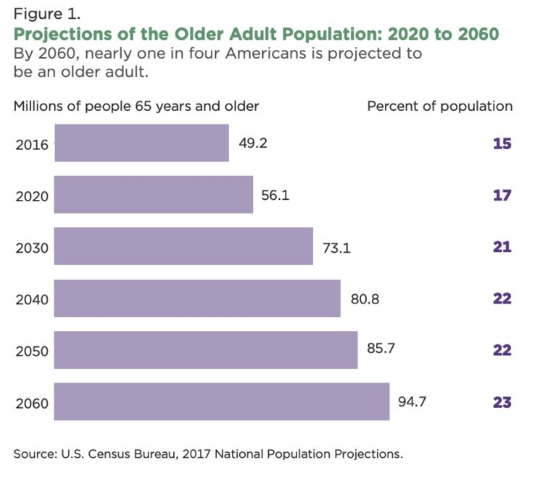


# Part 0: Package Imports

In [ ]:
# import all required packages
!pip install psaw    
import nltk
nltk.download('punkt')
nltk.download('twitter_samples')
nltk.download('averaged_perceptron_tagger')
nltk.download('maxent_ne_chunker')
nltk.download('words')
nltk.download('ieer')
nltk.download('stopwords')
from psaw import PushshiftAPI    #library Pushshift
import datetime as dt            #library for date management
import pandas as pd                        #library for data manipulation
import matplotlib.pyplot as plt  #library for plotting
import numpy as np
import seaborn as sns

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package twitter_samples to /root/nltk_data...
[nltk_data]   Unzipping corpora/twitter_samples.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping chunkers/maxent_ne_chunker.zip.
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.
[nltk_data] Downloading package ieer to /root/nltk_data...
[nltk_data]   Unzipping corpora/ieer.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
!python -m spacy download en_core_web_sm

/usr/local/lib/python3.8/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
2022-12-15 23:20:11.367497: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.8 MB 3.7 MB/s 
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


# Part I: Data Acquisition & Wrangling 

**Dataset Background** To understand this topic, we will use posts & comments from the 15,000+ subscribers in the r/agingparents subreddit. We will engage in a cycle of analyzing, visualizing, and interpreting the text contained in the posts Titles, Bodies, and Comments. 

## **1.1 Data Acquisition**

**Package Installation & Initialization**

To do this, we will use the **Python Pushshift.io API Wrapper-PSAW**  which, as stated in their documentation..."was designed and created by the /r/datasets mod team to help provide enhanced functionality and search capabilities for searching Reddit comments and submissions." It is a minimalist wrapper that helps provide enhanced functionality and search capabilities for searching Reddit comments and submissions. 

We will use this powerful package to fetch all the data for our r/AgingParents Reddit datasets.

In [ ]:
# Initialize PushShiftAPI object
!pip install praw
import praw
!pip install pushshift_py
from pushshift_py import PushshiftAPI
api = PushshiftAPI()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### **1.1.1 Get Submissions for r/AgingParents**
Here, we use `search_submissions()` to get all submissions data from subreddit '/AgingParents' and store the data into a dataframe `alltopic`

In [ ]:
# Get Submission title data
posts = list(api.search_submissions(
        subreddit='AgingParents	',#Subreddit we want to audit
        after=int(dt.datetime(2014, 1, 1).timestamp()),      #Start date
        before=int(dt.datetime(2022,12,12).timestamp()),       #End date
        filter=['id', 'author', 'created_utc',
                   'domain', 'url',
                   'title', 'num_comments','selftext'] ,        #Column names we want to retrieve
        limit=6000))          ##Max number of posts
alltopic = pd.DataFrame(posts)

Lets take a look at some of the data we've captured to ensure it makes sense and is behaving as expected. Below is the body of the posts which we will focus training on (col name `'selftext'`).

In [ ]:
# Get submission body data
alltopic['selftext']

0       Hi there! I'm (24y/o) one of four kids caring ...
1       Most advice I see on forums assumes that your ...
2                                                        
3                                                        
4       Hello All, finding this community has been a b...
                              ...                        
3981    My mom (65) has persecutory delusions involvin...
3982                                                     
3983                                                     
3984    My single mom (53) is being laid off and will ...
3985    Several months ago, we interviewed a few servi...
Name: selftext, Length: 3986, dtype: object

### **1.1.2 Get Comments for /AgingParents**
Here, we use `search_comments()` to get all comments data from subreddit '/AgingParents' and store the data into a dataframe `comments`

In [ ]:
# get submission comment data using API (store as CSV For easy loading later)
gen = api.search_comments(subreddit='AgingParents')
comments = []
for c in gen:
  comments.append(c)
  
# Change list to dataframe
allcomments = pd.DataFrame([thing.d_ for thing in comments])

Because we worked on this project in many sessions over several weeks, we decided to store the comments output into a .csv file that could be more quickly loaded into the notebook, rather than re-run the `search_comments()` each time we wanted to work - which ran for over 30 minutes before producing it's output.

In [ ]:
# Store in csv - already
#allcomments.to_csv(r'C:\Users\konsa\Desktop\comments.csv', header=True)

## **1.2 Data Cleaning: Join Titles, Body, Comments**

### **1.2.1 Clean Submissions**

**(a) Identify Key Fields**


---


Let's have a general look at the collumns in `alltopic` using `.info()` to see what we're working with:

In [ ]:
alltopic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3986 entries, 0 to 3985
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   author        3986 non-null   object
 1   created_utc   3986 non-null   int64 
 2   domain        3986 non-null   object
 3   id            3986 non-null   object
 4   num_comments  3986 non-null   int64 
 5   selftext      3986 non-null   object
 6   title         3986 non-null   object
 7   url           3986 non-null   object
 8   created       3986 non-null   object
 9   d_            3982 non-null   object
dtypes: int64(2), object(8)
memory usage: 311.5+ KB


**(b) Rename Columns and Change Data Format**


---


By looking at the actual value of `alltopic`, we found that the `created_utc` of the comments is in UNIX timestamp format. We have to convert it to a proper format for later analysis.

In [ ]:
# Convert UNIX timestamp format
alltopic["created_time"] = pd.to_datetime(alltopic["created_utc"], unit='s')
alltopic['created_date'] = alltopic['created_time'].dt.date
alltopic['created_year_month'] = alltopic['created_date'].map(lambda x: x.strftime('%Y-%m'))
alltopic.head()

,author,created_utc,domain,id,num_comments,selftext,title,url,created,d_,created_time,created_date,created_year_month
0,asthmatichicken,1667259233,self.AgingParents,yisht4,0,Hi there! I'm (24y/o) one of four kids caring ...,struggling with best next steps for mom,https://www.reddit.com/r/AgingParents/comments...,1667259233.0,"{'author': 'asthmatichicken', 'created_utc': 1...",2022-10-31 23:33:53,2022-10-31,2022-10
1,septembria18,1667257493,self.AgingParents,yirtk6,0,Most advice I see on forums assumes that your ...,Senior care: the best path for the poor?,https://www.reddit.com/r/AgingParents/comments...,1667257493.0,"{'author': 'septembria18', 'created_utc': 1667...",2022-10-31 23:04:53,2022-10-31,2022-10
2,mayurmedia,1667249227,self.AgingParents,yiogm1,0,,What are the Problems that Assisted Living/Sen...,https://www.reddit.com/r/AgingParents/comments...,1667249227.0,"{'author': 'mayurmedia', 'created_utc': 166724...",2022-10-31 20:47:07,2022-10-31,2022-10
3,Tupelo72,1667245115,self.AgingParents,yimh9s,0,,Guess I need to quit hiding in the garage and ...,https://www.reddit.com/r/AgingParents/comments...,1667245115.0,"{'author': 'Tupelo72', 'created_utc': 16672451...",2022-10-31 19:38:35,2022-10-31,2022-10
4,InBlazingWhiteFire,1667222584,self.AgingParents,yic2nr,0,"Hello All, finding this community has been a b...",Need help and advice please,https://www.reddit.com/r/AgingParents/comments...,1667222584.0,"{'author': 'InBlazingWhiteFire', 'created_utc'...",2022-10-31 13:23:04,2022-10-31,2022-10


### **1.2.2 Clean Comments**

**(a) Identify Key Fields**


---


Now we'll load up the .csv file we created so we can quickly look at the columns in `comments_df` using `.info()` 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
allcomments = pd.read_csv('/content/drive/My Drive/comments.csv')

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (2,16,21,25,29,31,32,38,39,53,58,59,60,61) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


Now we'll take a quick look at what's inside these comments, to make sure we understand what we've loaded and see if there's anything we can get rid of.

In [ ]:
allcomments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46024 entries, 0 to 46023
Data columns (total 62 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Unnamed: 0                       46024 non-null  int64  
 1   all_awardings                    44080 non-null  object 
 2   archived                         17772 non-null  object 
 3   associated_award                 0 non-null      float64
 4   author                           46024 non-null  object 
 5   author_flair_background_color    0 non-null      float64
 6   author_flair_css_class           0 non-null      float64
 7   author_flair_richtext            44839 non-null  object 
 8   author_flair_template_id         67 non-null     object 
 9   author_flair_text                105 non-null    object 
 10  author_flair_text_color          783 non-null    object 
 11  author_flair_type                44839 non-null  object 
 12  author_fullname   

In [ ]:
allcomments.head(50)

,Unnamed: 0,all_awardings,archived,associated_award,author,author_flair_background_color,author_flair_css_class,author_flair_richtext,author_flair_template_id,author_flair_text,...,retrieved_on,steward_reports,updated_utc,author_created_utc,nest_level,reply_delay,user_removed,mod_removed,rte_mode,permalink_url
0,0,[],False,NaN,Piscespixies_Mom,NaN,NaN,[],NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,[],False,NaN,OldDudeOpinion,NaN,NaN,[],NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,[],False,NaN,Time_Marcher,NaN,NaN,[],NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,[],False,NaN,Electronic_Remove_13,NaN,NaN,[],NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,[],False,NaN,Weltanschauung_Zyxt,NaN,NaN,[],NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,5,[],False,NaN,Damnmorefuckingsnow,NaN,NaN,[],NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,6,[],False,NaN,Major-Permission-435,NaN,NaN,[],NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,7,[],False,NaN,crzy19aka,NaN,NaN,[],NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,8,[],False,NaN,souprunknwn,NaN,NaN,[],NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,9,[],False,NaN,readzalot1,NaN,NaN,[],NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**(b) Drop Unnecessary Columns**


---


Looking at the above output, the returned dataframe has in total *61* columns and *45394* rows.  Many columns have null values and are not related to this project. Therefore, we will drop unrelated columns while only keeping the critical ones.

The columns we've chosen to keep are the comment's ID, the body of the text, the author of the comment, the link_id to allow us to retrieve comments within a post, the id of the parent comment/post, the scores, and some basic subreddit and created data. We believe these comments will be all us to explore the data without managing unneccessary features.

In [ ]:
# Drop columns
allcomments = allcomments[['id', 'body', 'author', 'created_utc', 'link_id', 'locked', 'parent_id', 'score', 'score_hidden', 'subreddit', 'subreddit_id', 'created']]

# Show heads of comments_df
allcomments.head()

,id,body,author,created_utc,link_id,locked,parent_id,score,score_hidden,subreddit,subreddit_id,created
0,iyd4wd4,I’ll start! My mom is 87 and a challenge to g...,Piscespixies_Mom,1669820099,t3_z8ssly,False,t3_z8ssly,1,True,AgingParents,t5_31k4q,1.669820e+09
1,iyd4gp3,Does she know she’s altered but just doesn’t u...,OldDudeOpinion,1669819908,t3_z81bz3,False,t3_z81bz3,1,True,AgingParents,t5_31k4q,1.669820e+09
2,iyd07s2,Be at peace. Death is inevitable. Turn to the ...,Time_Marcher,1669817978,t3_z8ijz6,False,t3_z8ijz6,1,True,AgingParents,t5_31k4q,1.669818e+09
3,iyczick,My mom has an Aura frame and it’s awesome. I’m...,Electronic_Remove_13,1669817645,t3_z8c1wh,False,t3_z8c1wh,1,True,AgingParents,t5_31k4q,1.669818e+09
4,iycou5d,You may need a professional neutral third part...,Weltanschauung_Zyxt,1669811879,t3_z87q2x,False,t3_z87q2x,1,True,AgingParents,t5_31k4q,1.669812e+09


**(c) Rename Columns and Change Data Format**


---



By looking at the actual value of `comments_df`, we found that the `created_utc` of the comments is in UNIX timestamp format. We have to convert it to a proper format for later analysis.

In [ ]:
# Convert UNIX timestamp format
allcomments["created_time"] = pd.to_datetime(allcomments["created_utc"], unit='s')
allcomments['created_date'] = allcomments['created_time'].dt.date
allcomments['created_year_month'] = allcomments['created_date'].map(lambda x: x.strftime('%Y-%m'))
allcomments.head()

,id,body,author,created_utc,link_id,locked,parent_id,score,score_hidden,subreddit,subreddit_id,created,created_time,created_date,created_year_month
0,iyd4wd4,I’ll start! My mom is 87 and a challenge to g...,Piscespixies_Mom,1669820099,t3_z8ssly,False,t3_z8ssly,1,True,AgingParents,t5_31k4q,1.669820e+09,2022-11-30 14:54:59,2022-11-30,2022-11
1,iyd4gp3,Does she know she’s altered but just doesn’t u...,OldDudeOpinion,1669819908,t3_z81bz3,False,t3_z81bz3,1,True,AgingParents,t5_31k4q,1.669820e+09,2022-11-30 14:51:48,2022-11-30,2022-11
2,iyd07s2,Be at peace. Death is inevitable. Turn to the ...,Time_Marcher,1669817978,t3_z8ijz6,False,t3_z8ijz6,1,True,AgingParents,t5_31k4q,1.669818e+09,2022-11-30 14:19:38,2022-11-30,2022-11
3,iyczick,My mom has an Aura frame and it’s awesome. I’m...,Electronic_Remove_13,1669817645,t3_z8c1wh,False,t3_z8c1wh,1,True,AgingParents,t5_31k4q,1.669818e+09,2022-11-30 14:14:05,2022-11-30,2022-11
4,iycou5d,You may need a professional neutral third part...,Weltanschauung_Zyxt,1669811879,t3_z87q2x,False,t3_z87q2x,1,True,AgingParents,t5_31k4q,1.669812e+09,2022-11-30 12:37:59,2022-11-30,2022-11


From the api documentation https://praw.readthedocs.io/en/stable/code_overview/models/comment.html, we find out that `link_id` represent the submission ID that the comment belongs to and are appended with a prefix *t3_*. Also, `parent_id` represents the the ID of the parent comment (prefixed with *t1_*). If it is a top-level comment, this returns the submission ID instead (prefixed with *t3_*). <br>
Therefore, we need to remove the prefix for these two columns.

In [ ]:
# Remove prefix for link_id and parent_id columns
allcomments['clean_link_id'] = allcomments['link_id'].apply(lambda x: x[3:])
allcomments['clean_parent_id'] = allcomments['parent_id'].apply(lambda x: x[3:])
allcomments.head()

,id,body,author,created_utc,link_id,locked,parent_id,score,score_hidden,subreddit,subreddit_id,created,created_time,created_date,created_year_month,clean_link_id,clean_parent_id
0,iyd4wd4,I’ll start! My mom is 87 and a challenge to g...,Piscespixies_Mom,1669820099,t3_z8ssly,False,t3_z8ssly,1,True,AgingParents,t5_31k4q,1.669820e+09,2022-11-30 14:54:59,2022-11-30,2022-11,z8ssly,z8ssly
1,iyd4gp3,Does she know she’s altered but just doesn’t u...,OldDudeOpinion,1669819908,t3_z81bz3,False,t3_z81bz3,1,True,AgingParents,t5_31k4q,1.669820e+09,2022-11-30 14:51:48,2022-11-30,2022-11,z81bz3,z81bz3
2,iyd07s2,Be at peace. Death is inevitable. Turn to the ...,Time_Marcher,1669817978,t3_z8ijz6,False,t3_z8ijz6,1,True,AgingParents,t5_31k4q,1.669818e+09,2022-11-30 14:19:38,2022-11-30,2022-11,z8ijz6,z8ijz6
3,iyczick,My mom has an Aura frame and it’s awesome. I’m...,Electronic_Remove_13,1669817645,t3_z8c1wh,False,t3_z8c1wh,1,True,AgingParents,t5_31k4q,1.669818e+09,2022-11-30 14:14:05,2022-11-30,2022-11,z8c1wh,z8c1wh
4,iycou5d,You may need a professional neutral third part...,Weltanschauung_Zyxt,1669811879,t3_z87q2x,False,t3_z87q2x,1,True,AgingParents,t5_31k4q,1.669812e+09,2022-11-30 12:37:59,2022-11-30,2022-11,z87q2x,z87q2x


### **1.2.3 Basic EDA: Time series - subreddit activity over time**

Since we are going to explore the problem faced by the subscribers in this AgingParents subreddit, it's good to have a general idea of the activity trend of this subreddit that might gives us some inputs on when and what issues the authors of the posts have been facing.

Initially, we plotted the posts per day, but the chart was extremely noisy and difficult to interpret. Instead, we've created a chart below that plots the number of posts per month, which yielded a much smoother and interpretable visualization. Finally, to make the spikes easier to compare against something, we added the rolling-average line.

In [ ]:
# Group by day and get count, plot to show activity over time. Discover COVID-19 had a big impact on the subreddit

# Posts/Topics creation activity
topics_create_count_df = alltopic.groupby('created_year_month').size().to_frame('count').reset_index()

In [ ]:
# Comments creation activity
comments_create_count_df = allcomments.groupby('created_year_month').size().to_frame('count').reset_index()
comments_create_count_df

,created_year_month,count
0,2014-04,2
1,2014-05,4
2,2014-07,1
3,2014-08,1
4,2015-01,6
...,...,...
86,2022-07,1770
87,2022-08,1642
88,2022-09,1512
89,2022-10,2298


Let's visualize the trend of the activity using seaborn.

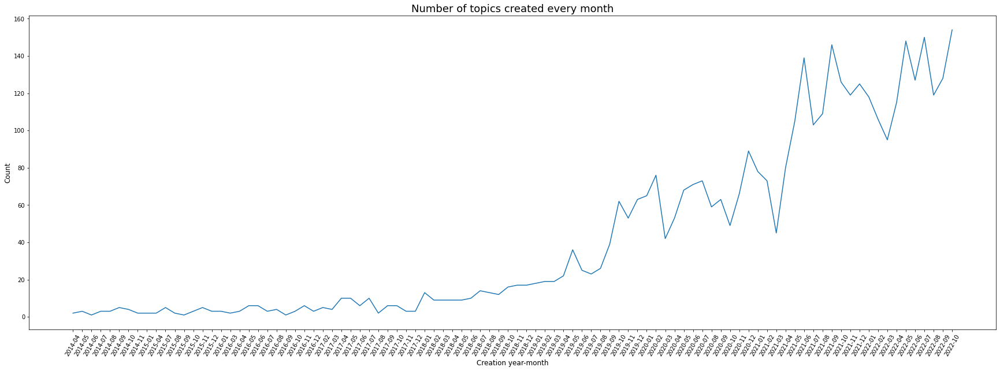

In [ ]:
#change the label of x and y 
plt.figure(figsize=(30,10))
ax = sns.lineplot(data=topics_create_count_df, x="created_year_month", y="count")
ax.set_title("Number of topics created every month", size=18)
ax.set_xlabel("Creation year-month", size=12)
ax.set_ylabel("Count", size=12)
ax.tick_params(axis='x', rotation=60)

We noticed the obvious spikes at some surprising points and vowed to investigate them further. 

1.   We were surprised by the spike in the Fall of 2019, beginning in the comnth of October and remaining strong until January. (October more than doubled the 3-month rolling average of posts per day.)
2.  We were intriguied, but not surprised by the heightened activity around the start of COVID-19 (March-May of 2020)
3.  The spring of 2021 (April-June) also presented an interesting and staggering growth in average posts per day

In hopes of finding a simple and obvious explanation, we selected posts from those 3 areas and quickly read through some of their Titles and some of the their bodies. Unfortunately, we could not discern an obvious reason for the jumps in the first and third areas of interest.

Later, you will see created word clouds for each of these periods, to see if anything interesting jumps out to explain the jumps.





In [ ]:
#Give the columns width/breathing room so we can easily skim through them
pd.set_option('display.max_colwidth', None)

#Select posts from the first area of interest
jump_1_df = alltopic[(alltopic['created_date'] < pd.Timestamp('2019-10-31')) & (alltopic['created_date'] > pd.Timestamp('2019-10-1'))].head(25)
jump_1_df

In [ ]:
#Select posts from the second area of interest (beginning of COVID)
jump_2_df = alltopic[(alltopic['created_date'] < pd.Timestamp('2020-5-31')) & (alltopic['created_date'] > pd.Timestamp('2020-3-1'))]
jump_2_df.head(10)

In [ ]:
#Select posts from the third area of interest: Spring of 2021
jump_3_df = alltopic[(alltopic['created_date'] < pd.Timestamp('2021-6-30')) & (alltopic['created_date'] > pd.Timestamp('2021-4-1'))]
jump_3_df

Next, we plotted Comments Created Per Month to see if the trend and jumps were synchronous with those of the Posts Created Per Month, with the expectation that any asynchronous behavior should be examined further. We plotted them on the same chart and found that the difference in scale between the two made them very difficult to compare. After seeing that both plots showed exponential growth over time, and that the scale between them was so tremendously different, we chose to increase the interpretability of the visualization by changing the Y-axis to Log scale. After doing so, we saw that the number of posts and the number of comments rise and fall together, but that a small increase in the number of posts creates and outsized impact on the number of comments. 

*Note: due to a shutdown of the API supplying our data, we have included an image of what the two lines plotted together showed*

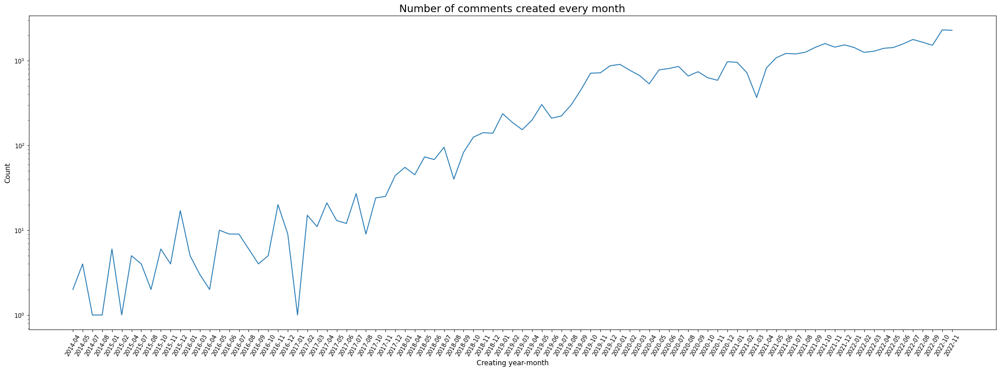

In [ ]:
plt.figure(figsize=(30,10))

#comments per month line
ax = sns.lineplot(data=comments_create_count_df, x="created_year_month", y="count")

# #topics per month line
# ax = sns.lineplot(data=topics_create_count_df, x="created_year_month", y="count")

ax.set_title("Number of comments created every month", size=18)
ax.set_xlabel("Creating year-month", size=12)
ax.set_ylabel("Count", size=12)
ax.tick_params(axis='x', rotation=60)

#logarithmic y axis bc they are totally different scales
ax.set_yscale("log")

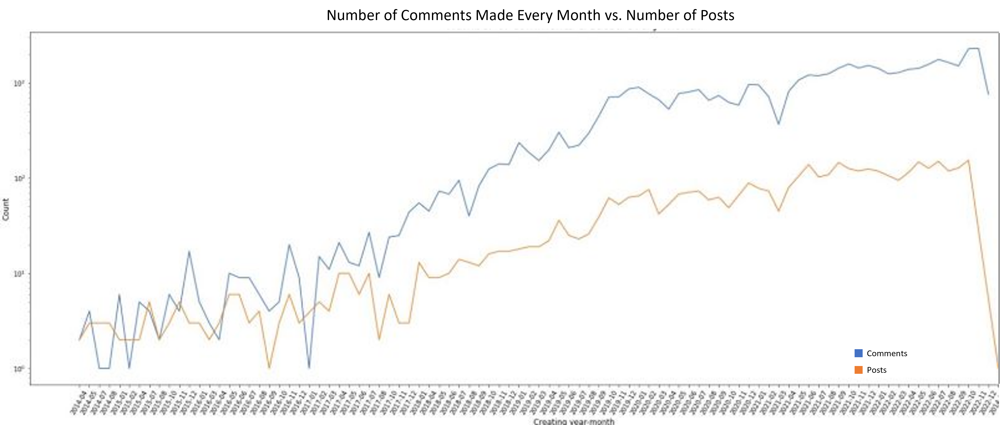

### **1.2.4 Basic EDA: Word Count Distribution for Posts-Titles and Post-Bodies**

In order to get the lay of the land, we looked at the spread of words-per-post across our dataset. The posts we looked at (somewhat at random) to build a baseline understanding of the context were all fairly long, but we wanted to have a more generalizable understanding of how verbose posters were being before beginning the more involved NLP techniques below. We began with extremely long X-axes to see how long the tails were - and they were extremely, extremely long given that some users wrote incredibly long posts. Then, we trimmed the x-axis down to a range that was both representative of the data while still easy to interpret.

**(a) Word Count Distribution for Post Titles**


---



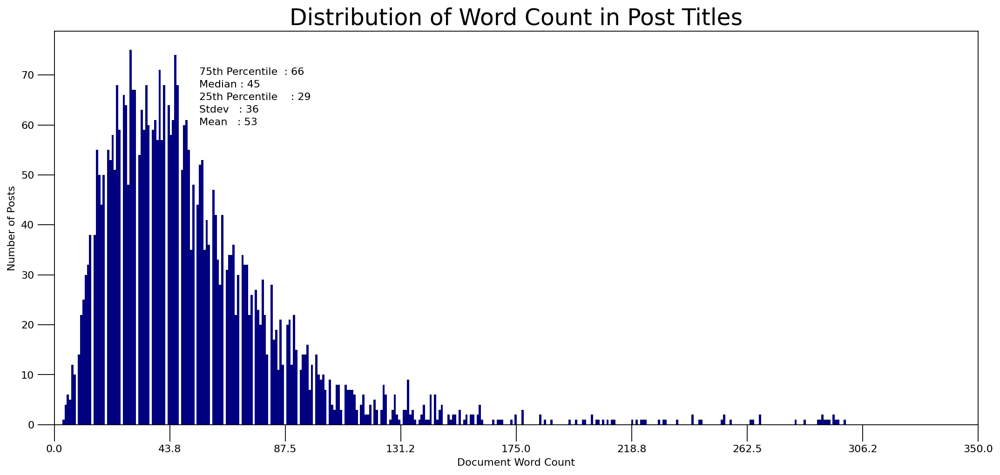

In [ ]:
import numpy as np
doc_lens = [len(d) for d in alltopic['title']]

char_max = 350

# Plot
plt.figure(figsize=(16,7), dpi=160)
plt.hist(doc_lens, bins = char_max, color='navy')

x_val = 55

y_val = 60
y_increment = 2.5


plt.hist(doc_lens, bins = char_max, color='navy')
plt.text(x_val, y_val, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(x_val, y_val+ y_increment*1, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(x_val, y_val+ y_increment*2, "25th Percentile    : " + str(round(np.quantile(doc_lens, q=0.25))))
plt.text(x_val, y_val+ y_increment*3, "Median : " + str(round(np.median(doc_lens))))
plt.text(x_val, y_val+ y_increment*4, "75th Percentile  : " + str(round(np.quantile(doc_lens, q=0.75))))

plt.gca().set(xlim=(0, char_max), ylabel='Number of Posts', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,char_max,9))
plt.title('Distribution of Word Count in Post Titles', fontdict=dict(size=22))
plt.show()

**(b) Word Count Distribution for Post Bodies**


---



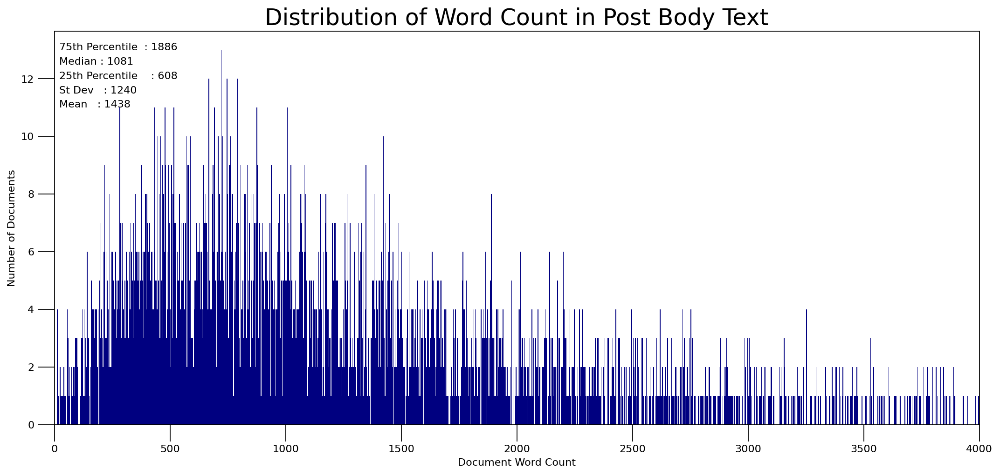

In [ ]:
cleaned_selftext_df = [x for x in alltopic['selftext'] if x != ""  and x != "[removed]" and x!= "[deleted]" ]
#cleaned_selftext_df = [x for x in cleaned_selftext_df if x != "[removed]" ]

doc_lens = [len(d) for d in cleaned_selftext_df]

#write something in here about how we made the numebr gigantic to see where the tail ended 
char_max = 4000

y_val = 11
increment = .5

# Plot
plt.figure(figsize=(16,7), dpi=160)

plt.hist(doc_lens, bins = char_max, color='navy')
plt.text(20, y_val, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(20, y_val+ increment*1, "St Dev   : " + str(round(np.std(doc_lens))))
plt.text(20, y_val+ increment*2, "25th Percentile    : " + str(round(np.quantile(doc_lens, q=0.25))))
plt.text(20, y_val+ increment*3, "Median : " + str(round(np.median(doc_lens))))
plt.text(20, y_val+ increment*4, "75th Percentile  : " + str(round(np.quantile(doc_lens, q=0.75))))

plt.gca().set(xlim=(0, char_max), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,char_max,9))
plt.title('Distribution of Word Count in Post Body Text', fontdict=dict(size=22))



plt.show()

**(c) Word Count Distribution for Comments**


---



Plotting the word-counts above, we saw that a large portion of the posts were  even longer than we expected. Half of all post titles were more than 45 words long, with a median post-body-length of about 1000 words. Wow do people have a lot to say!

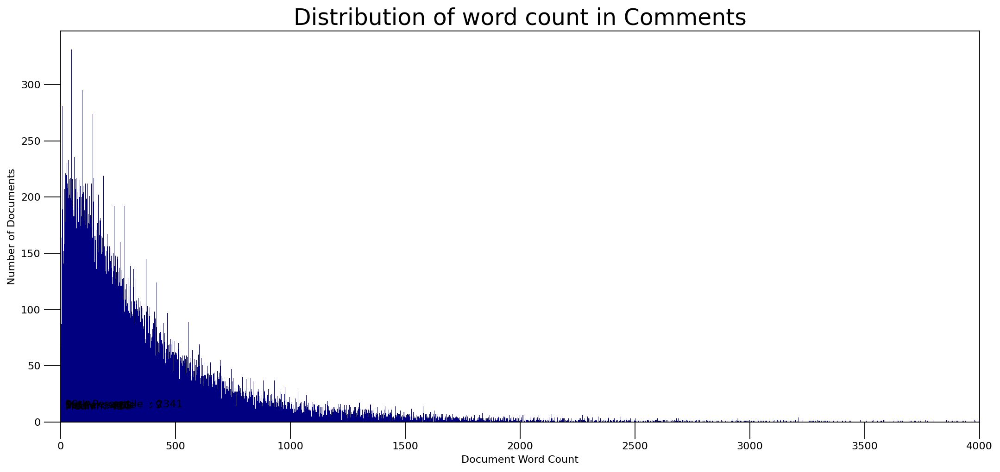

In [ ]:
cleaned_comments_df = [x for x in allcomments['body'] if x != ""  and x != "[removed]" and x!= "[deleted]" ]

doc_lens = [len(d) for d in cleaned_comments_df]

#write something in her eabout how we made the numebr gigantic to see where the tail ended 
char_max = 4000

y_val = 11
increment = .5

# Plot
plt.figure(figsize=(16,7), dpi=160)

plt.hist(doc_lens, bins = char_max, color='navy')
plt.text(20, y_val, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(20, y_val+ increment, "Median : " + str(round(np.median(doc_lens))))
plt.text(20, y_val+ increment*2, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(20, y_val+ increment*3, "1st Percentile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(20, y_val+ increment*4, "99th Percentile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, char_max), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,char_max,9))
plt.title('Distribution of word count in Comments', fontdict=dict(size=22))



plt.show()

# **Part II: Text Analysis: Wordclouds**


## **2.1 Data Preparation for WordCloud**
In the spirit of refining our understanding of the landscape we're dealing with, we began our text analysis with wordclouds. These were intended to give us a crude but easy-to-execute look at the data we've collected. The objective here was to simply get the lay of the land, and see if any mountains stood out. 



In [ ]:
#incantations for wordcloud and counters and tokenization
import nltk
nltk.download('punkt')
from wordcloud import WordCloud
import matplotlib.pyplot as plt 
import re
from collections import Counter 


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Removing unhelpful words using stop_words and .extend: We have downloaded a standard set of common but un-meaningful ('stopwords'). We'll use this file to remove unhelpful words from our dataset in the tokenize_content function below. The vanilla version served most of our purposes, but after looking at the output of our wordcloud, and later the output of our (spoiler alert) LDA, we found a variety of words that were very common and very useless: 'https', 'get', 'go', 'may', and others were crowding the space, without adding any insight. As you can see above, we've added them to stopwords. We thank Akash Kandpal for showing us this through [his stackoverflow post](https://stackoverflow.com/questions/29275063/how-to-extend-the-stopword-list-from-nltk-and-remove-stop-words-with-the-extende).

In [ ]:
# NLTK Stop words
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

#stop_words = stopwords.words('english')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Below, we set up the `tokenize_content` function needed to tokenize the text in each post, clean up the posts by making them all lowercase and removing non-alphabetical characters, and deleting the list of unhelpful 'stopwords' we downloaded and customized earler. We then flatten the list so that the `WordCloud` and `Counter()` functions have correctly shaped inputs.

In [ ]:
from nltk.corpus import stopwords
nltk.download('stopwords')
stopwords = stopwords.words('english')
stopwords.extend(['from', 'use', 'get', 'go', 'may', 'can','say', 'https', 'http','ve'])
# TODO: tokenize and flatten
def tokenize_content(content):
  tokenized_list = nltk.word_tokenize(content)
  temp = [w.lower() for w in tokenized_list if w.isalpha()]
  res = [w for w in temp if w not in stopwords]
  return res

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
#tokenize all submission titles
alltopiclist = [tokenize_content(row) for row in alltopic['title']]

#flatten all submission titles
flat_alltopiclist = [item for sublist in alltopiclist for item in sublist] 

#peep the output for verification
print(flat_alltopiclist)

['struggling', 'best', 'next', 'steps', 'mom', 'senior', 'care', 'best', 'path', 'poor', 'problems', 'assisted', 'care', 'living', 'business', 'struggling', 'overcome', 'looking', 'solution', 'guess', 'need', 'quit', 'hiding', 'garage', 'check', 'mums', 'need', 'help', 'advice', 'please', 'dad', 'intolerance', 'things', 'driving', 'insane', 'parents', 'live', 'far', 'away', 'transportation', 'aging', 'parents', 'unsure', 'difficult', 'grandfather', 'assisted', 'living', 'likely', 'work', 'father', 'died', 'days', 'ago', 'favorable', 'circunstances', 'died', 'sleep', 'didnt', 'suffer', 'never', 'lost', 'mental', 'clarity', 'still', 'recognized', 'son', 'long', 'life', 'gratefull', 'still', 'feel', 'wont', 'recover', 'loss', 'mom', 'independent', 'living', 'facility', 'never', 'leaves', 'room', 'ways', 'parent', 'finances', 'assisted', 'living', 'basic', 'questions', 'advice', 'needed', 'fil', 'acknowledges', 'poor', 'health', 'plentiful', 'resources', 'ultimately', 'resists', 'change', 

In [ ]:
#tokenize all body text from each submission
allbodylist = [tokenize_content(row) for row in alltopic['selftext']]

#flatten all body text from each submission
flat_allbodylist = [item for sublist in allbodylist for item in sublist] 

#peep the output for verification
print(allbodylist)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
#Tokenize and flatten all body text from posts in Jump_Period_1
jump1_tokenized = [tokenize_content(row) for row in jump_1_df['selftext']]
jump1_wc_input = [item for sublist in jump1_tokenized for item in sublist] 
#peep the output for verification
print(jump1_wc_input)


#Jump_Period_2 tokenized and flattened
jump2_tokenized = [tokenize_content(row) for row in jump_2_df['selftext']]
jump2_wc_input = [item for sublist in jump2_tokenized for item in sublist] 
#peep the output for verification
print(jump2_wc_input)


#Jump_Period_3 tokenized and flattened
jump3_tokenized = [tokenize_content(row) for row in jump_3_df['selftext']]
jump3_wc_input = [item for sublist in jump3_tokenized for item in sublist] 
#peep the output for verification
print(jump3_wc_input)


['hello', 'dad', 'believe', 'stage', 'dementia', 'money', 'gets', 'social', 'security', 'finding', 'sleeping', 'car', 'placed', 'assisted', 'living', 'group', 'home', 'last', 'month', 'stubborn', 'man', 'got', 'kicked', 'group', 'home', 'bad', 'behavior', 'mood', 'swings', 'paranoia', 'urinates', 'makes', 'month', 'texas', 'qualify', 'medicaid', 'cause', 'income', 'official', 'diagnosis', 'group', 'home', 'supposed', 'get', 'doctor', 'assess', 'dont', 'think', 'child', 'moving', 'months', 'states', 'korea', 'non', 'military', 'job', 'trying', 'find', 'stable', 'housing', 'dont', 'worry', 'gone', 'im', 'extremely', 'frustrated', 'happening', 'options', 'put', 'stable', 'home', 'got', 'phone', 'call', 'yesterday', 'morning', 'dad', 'real', 'estate', 'agent', 'saying', 'taken', 'hospital', 'sure', 'led', 'neighbour', 'called', 'ambulance', 'alerted', 'estate', 'agent', 'psychotic', 'episode', 'long', 'story', 'short', 'either', 'refuses', 'take', 'parkinson', 'medication', 'properly', 'bi

We discovered some noisy words like **"removed"**, **"deleted"** in the `allbodylist` which should be cleaned to make sure they don't interfere with the result of word clouds.

In [ ]:
for i in range(len(allbodylist)):
  if len(allbodylist[i]) == 0:
    allbodylist[i].extend(alltopiclist[i])
  elif allbodylist[i][0] == "removed":
    allbodylist[i].pop(0)
    allbodylist[i].extend(alltopiclist[i])
  elif allbodylist[i][0] == 'deleted':
    allbodylist[i].pop(0)
    allbodylist[i].extend(alltopiclist[i])

In [ ]:
for i in range(len(allbodylist)):
  print(allbodylist[i])

['hi', 'one', 'four', 'kids', 'caring', 'mom', 'split', 'duties', 'tasks', 'recently', 'moved', 'mom', 'live', 'senior', 'living', 'facility', 'nearby', 'siblings', 'handle', 'bulk', 'interactions', 'appointments', 'struggling', 'immensely', 'next', 'steps', 'mom', 'mental', 'illness', 'complicates', 'obtaining', 'diagnosis', 'even', 'understanding', 'exactly', 'going', 'summary', 'suffered', 'severe', 'clinical', 'depression', 'years', 'psychiatric', 'medications', 'years', 'count', 'recently', 'hospitalized', 'twice', 'last', 'year', 'severe', 'depression', 'inability', 'care', 'seemed', 'improve', 'beginning', 'ketamine', 'treatments', 'year', 'ago', 'since', 'tapered', 'treatments', 'completely', 'unwilling', 'participate', 'psychotherapy', 'meet', 'biweekly', 'psychiatrist', 'displaying', 'cognitive', 'decline', 'decreased', 'ability', 'care', 'rapidly', 'within', 'last', 'two', 'years', 'even', 'rampant', 'last', 'six', 'months', 'becomes', 'distressed', 'complete', 'full', 'neur

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['posted', 'legal', 'advice', 'got', 'downvoted', 'responses', 'slightly', 'edited', 'posting', 'hoping', 'advice', 'proceed', 'father', 'years', 'old', 'hoarder', 'floor', 'ceiling', 'bad', 'heat', 'last', 'winter', 'well', 'fire', 'hazard', 'hoarding', 'used', 'furnace', 'house', 'since', 'infant', 'uses', 'wood', 'stove', 'even', 'bother', 'getting', 'wood', 'last', 'year', 'hoard', 'want', 'phone', 'bought', 'phones', 'refuses', 'want', 'drive', 'would', 'rather', 'ride', 'bike', 'year', 'long', 'mentally', 'ill', 'suspect', 'done', 'lot', 'things', 'crazy', 'want', 'help', 'becomes', 'angry', 'threatening', 'volatile', 'try', 'help', 'gave', 'ultimatum', 'last', 'night', 'recently', 'started', 'habit', 'hanging', 'homeless', 'crackhead', 'women', 'want', 'take', 'advantage', 'hes', 'egotistical', 'thinks', 'actually', 'like', 'one', 'neighbors', 'already', 'called', 'code', 'compliance', 'dads', 'yard', 'ignored', 'series', 'letters', 'city', 'years', 'thought', 'would', 'actually

In [ ]:
#Tokenize comments 
allcommentlist = [tokenize_content(row) for row in allcomments['body']]

#Flatten comments
flat_allcommentlist = [item for sublist in allcommentlist for item in sublist] 

#peep the output for verification
print(flat_allcommentlist)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## **2.2 Wordclouds for Post Titles, Bodies, and Comments**

### 2.2.1 Wordcloud for Post Titles

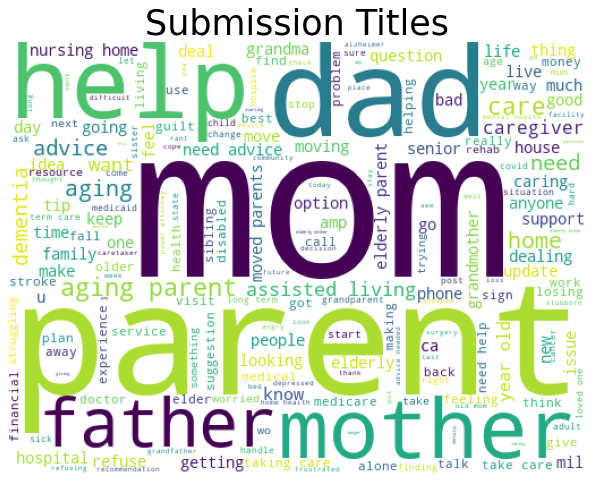

[('parents', 455), ('mom', 447), ('dad', 324), ('help', 323), ('aging', 313), ('care', 285), ('mother', 269), ('parent', 235), ('advice', 195), ('father', 190), ('home', 189), ('living', 172), ('need', 160), ('elderly', 150), ('old', 139), ('get', 117), ('dementia', 109), ('assisted', 105), ('health', 100), ('year', 91)]


In [ ]:
#Wordcloud: Submission Titles

plt.subplots(figsize = (20,8))

wordcloud = WordCloud (
                    background_color = 'white',
                    width = 512,
                    height = 384
                        ).generate(' '.join(flat_alltopiclist))
plt.imshow(wordcloud) # image show
plt.axis('off') # to off the axis of x and y
plt.title('Submission Titles', fontdict=dict(size=35))

plt.show()


#Word count behind this wordcloud
cnt_title = Counter()

for word in flat_alltopiclist:
  cnt_title[word] += 1

top_title_words = cnt_title.most_common(200)
print(top_title_words[0:20])


### 2.2.2 Wordcloud for Post Bodies

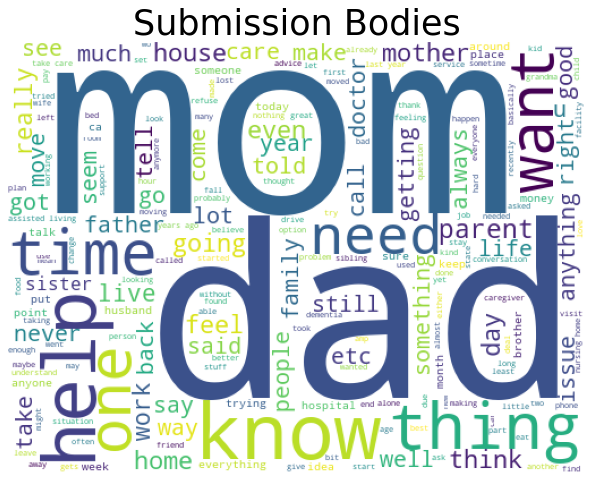

[('mom', 4234), ('get', 3561), ('dad', 3347), ('like', 3101), ('help', 2932), ('care', 2855), ('would', 2844), ('home', 2746), ('time', 2703), ('know', 2501), ('years', 2219), ('parents', 2143), ('one', 2101), ('want', 1954), ('go', 1928), ('mother', 1873), ('house', 1862), ('going', 1761), ('also', 1751), ('even', 1748)]


In [ ]:
##Wordcloud submission body
#Create Wordcloud and display
plt.subplots(figsize = (20,8))

wordcloud = WordCloud (
                    background_color = 'white',
                    width = 512,
                    height = 384
                        ).generate(' '.join(flat_allbodylist))
plt.imshow(wordcloud) # image show
plt.axis('off') # to off the axis of x and y
plt.title('Submission Bodies', fontdict=dict(size=35))

plt.show()

#Word count behind this wordcloud
for word in flat_allbodylist:
  cnt_title[word] += 1

top_body_words = cnt_title.most_common(200)
print(top_body_words[0:20])


### 2.2.3 Wordcloud for Comments

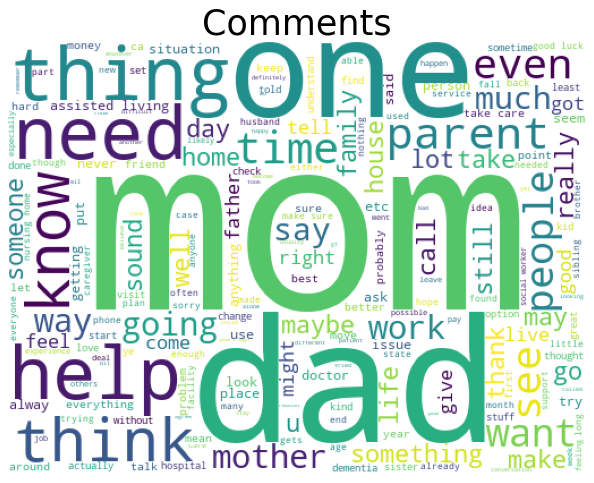

[('get', 33247), ('mom', 31484), ('like', 28213), ('would', 27882), ('care', 27311), ('help', 24378), ('time', 21919), ('dad', 21915), ('one', 20987), ('know', 20025), ('home', 18214), ('also', 17203), ('good', 16947), ('could', 16770), ('take', 16498), ('need', 16272), ('make', 15825), ('go', 15494), ('things', 15217), ('going', 15025)]


In [ ]:
#Wordcloud: Submission Comments
plt.subplots(figsize = (20,8))

wordcloud = WordCloud (
                    background_color = 'white',
                    width = 512,
                    height = 384
                        ).generate(' '.join(flat_allcommentlist))
plt.imshow(wordcloud) # image show
plt.axis('off') # to off the axis of x and y
plt.title('Comments', fontdict=dict(size=35))

plt.show()

#Word count behind this wordcloud
for word in flat_allcommentlist:
  cnt_title[word] += 1

top_comment_words = cnt_title.most_common(200)
print(top_comment_words[0:20])

Immediately, we noticed that Mom and Mother were much more frequent than any other words or concepts - including Dad and Father. Besides, help, need, time, think,.. also are interesting words to examinize later. 



As an aside, you may notice that we print the top 20 Words and the number of times they occur below the wordcloud visualiazations. This is to serve as an aide in interpretation: we noticed that words like 'parent' were taking up more real-estate than they were due because they had more letters. 

## **2.3 Wordclouds to Examine Zones of Interest from Time Series EDA**

We would like to know if there's any significant changes in the frequent words that appeared during the 3 jumps we've discovered in 1.2.3. Here's the plotting of word clouds for each of the three time period.

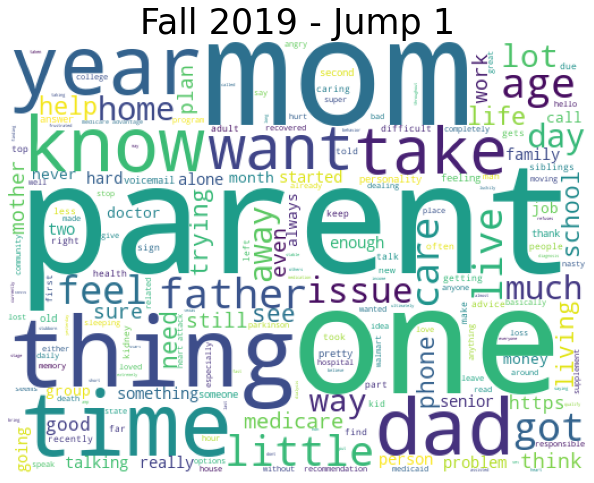

[('like', 17), ('mom', 15), ('one', 14), ('parents', 14), ('things', 13), ('dad', 12), ('time', 10), ('know', 10), ('father', 10), ('age', 10), ('little', 10), ('medicare', 10), ('got', 9), ('get', 9), ('feel', 9), ('day', 8), ('also', 8), ('away', 8), ('much', 8), ('want', 8), ('way', 8), ('help', 8), ('life', 8), ('living', 7), ('home', 7), ('trying', 7), ('phone', 7), ('take', 7), ('live', 7), ('year', 7), ('issues', 7), ('care', 7), ('school', 7), ('sure', 6), ('still', 6), ('mother', 6), ('even', 6), ('https', 6), ('good', 6), ('see', 6), ('something', 6), ('lot', 6), ('family', 6), ('person', 6), ('would', 6), ('two', 6), ('years', 6), ('really', 6), ('enough', 6), ('started', 6)]


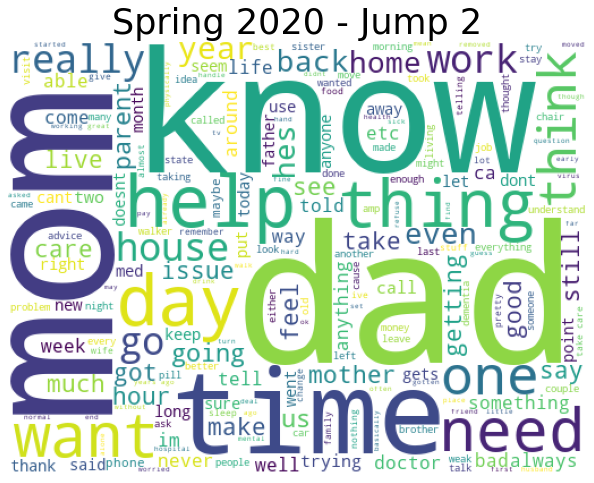

[('get', 162), ('mom', 149), ('dad', 144), ('help', 110), ('know', 104), ('like', 100), ('time', 94), ('care', 91), ('would', 83), ('go', 82), ('one', 82), ('back', 77), ('home', 76), ('years', 75), ('really', 75), ('day', 75), ('house', 75), ('want', 71), ('parents', 65), ('hes', 65), ('things', 63), ('even', 63), ('think', 63), ('going', 63), ('days', 62), ('take', 61), ('us', 60), ('since', 60), ('work', 60), ('also', 58), ('good', 56), ('got', 56), ('getting', 54), ('could', 54), ('much', 54), ('mother', 52), ('still', 52), ('need', 51), ('see', 51), ('last', 51), ('bad', 50), ('ago', 50), ('something', 47), ('year', 46), ('away', 45), ('always', 45), ('never', 44), ('anything', 44), ('make', 44), ('life', 44)]


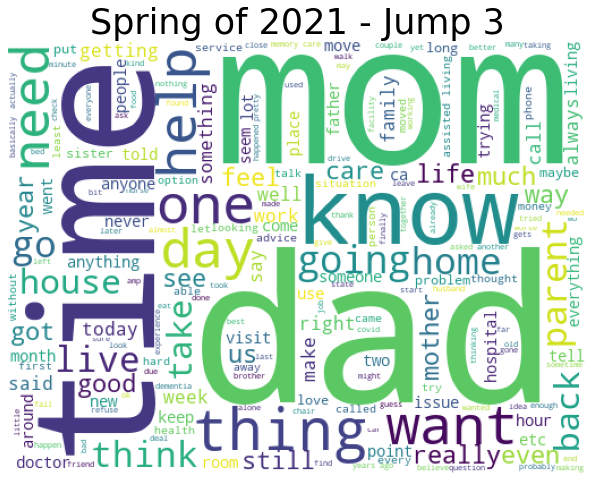

[('dad', 367), ('mom', 349), ('get', 288), ('like', 234), ('time', 232), ('would', 228), ('care', 220), ('know', 212), ('home', 183), ('one', 179), ('help', 167), ('years', 164), ('going', 163), ('go', 156), ('want', 153), ('things', 151), ('parents', 150), ('also', 148), ('day', 138), ('back', 133), ('house', 131), ('take', 128), ('could', 127), ('much', 125), ('even', 125), ('life', 121), ('really', 120), ('living', 119), ('think', 117), ('mother', 113), ('still', 113), ('see', 112), ('need', 112), ('feel', 107), ('got', 103), ('us', 103), ('good', 101), ('getting', 96), ('family', 95), ('way', 94), ('right', 91), ('said', 91), ('live', 89), ('something', 88), ('anyone', 86), ('two', 85), ('well', 83), ('always', 83), ('week', 83), ('work', 81)]


In [ ]:
#Wordcloud: Fall of 2019 - First interesting Jump in Time Series EDA
plt.subplots(figsize = (20,8))

wordcloud = WordCloud (
                    background_color = 'white',
                    width = 512,
                    height = 384
                        ).generate(' '.join(jump1_wc_input))
plt.imshow(wordcloud) # image show
plt.axis('off') # to off the axis of x and y
plt.title('Fall 2019 - Jump 1', fontdict=dict(size=35))

plt.show()


#Word count behind this wordcloud
cnt_title = Counter()

for word in jump1_wc_input:
  cnt_title[word] += 1

top_title_words = cnt_title.most_common(200)
print(top_title_words[0:50])


#-------------------------------------------------------
#Wordcloud: Spring of 2020 - Second interesting Jump in Time Series EDA
plt.subplots(figsize = (20,8))

wordcloud = WordCloud (
                    background_color = 'white',
                    width = 512,
                    height = 384
                        ).generate(' '.join(jump2_wc_input))
plt.imshow(wordcloud) # image show
plt.axis('off') # to off the axis of x and y
plt.title('Spring 2020 - Jump 2', fontdict=dict(size=35))

plt.show()


#Word count behind this wordcloud
cnt_title = Counter()

for word in jump2_wc_input:
  cnt_title[word] += 1

top_title_words = cnt_title.most_common(200)
print(top_title_words[0:50])


#-------------------------------------------------------
#Wordcloud: Spring of 2021 - Third Interesting Jump in Time Series EDA
plt.subplots(figsize = (20,8))

wordcloud = WordCloud (
                    background_color = 'white',
                    width = 512,
                    height = 384
                        ).generate(' '.join(jump3_wc_input))
plt.imshow(wordcloud) # image show
plt.axis('off') # to off the axis of x and y
plt.title('Spring of 2021 - Jump 3', fontdict=dict(size=35))

plt.show()


#Word count behind this wordcloud
cnt_title = Counter()

for word in jump3_wc_input:
  cnt_title[word] += 1

top_title_words = cnt_title.most_common(200)
print(top_title_words[0:50])


**Interpretation:** A comparison of the word count frequencies between these 3 periods, both through wordclouds and word count, don't seem to show a significant difference between the most common words. Further, they all seem to be consisent with the words that dominated the broader dataset, with none having many words that jump out as surprising for that period.

# **Part III: Analysis of Key Topics Using Latent Dirichlet Allocation (LDA)**


## **3.1 Initial LDA**

**Topic modeling** is a method for **unsupervised** clustering of documents, similar to clustering on numeric data, which finds some natural groups of items (topics) even when we’re not sure what we’re looking for. In this case, to better understand the topic in order to find the insight of the group 'Aging Parents', LDA is our to-go model. It's readily interpretable, balances power with simplicity, and it is well-documented. It is for these reasons we turn to it in our time of topic-modeling need. We use LDA to discover what sort of topic 'clusters' ('clusters' being used loosely here) conversations tend to coalesce around.

Initially, we did not include bigrams and trigrams. This yielded dissapointing results. Basically, we just fed to the models a bag of words without consideration the connection between them. Some words will go together for example Machine Learning, health insurance,... Therefore, by not using n-grams, the model gave us the meaningless topics. By using N-grams (in our case bigram and trigram), we could tell the model that which words usually show up together


In [ ]:
# Build the bigram and trigram models
import gensim
from gensim.utils import simple_preprocess
bigram = gensim.models.Phrases(allbodylist, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[allbodylist], threshold=100)  
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [ ]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [ ]:
import spacy
#Form Bigrams
data_words_bigrams = make_bigrams(allbodylist)

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
nlp = spacy.load("en_core_web_sm", disable=['parser', 'ner'])

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:1][0][:30])

['kid', 'care', 'mom', 'split', 'duty', 'task', 'recently', 'move', 'mom', 'live', 'senior', 'living', 'facility', 'nearby', 'sibling', 'handle', 'bulk', 'interaction', 'appointment', 'struggle', 'immensely', 'next', 'step', 'mom', 'mental_illness', 'complicate', 'obtain', 'diagnosis', 'even', 'understand']


In [ ]:
import gensim.corpora as corpora

# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1][0][:30])

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 2), (7, 1), (8, 1), (9, 2), (10, 1), (11, 2), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 2), (20, 2), (21, 1), (22, 5), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 3), (29, 1)]


Baseline Model with default alpha and beta and parameters, number of topic initial choose = 10


In [ ]:
# Build LDA model
import numpy as np
np.random.seed = 200
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=10, 
                                       chunksize=100,
                                       passes=10,
                                       per_word_topics=True)

Print the topics clustered by our LDA model.

In [ ]:
from pprint import pprint

# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.019*"want" + 0.018*"year" + 0.017*"feel" + 0.015*"time" + 0.014*"life" + '
  '0.014*"parent" + 0.014*"mom" + 0.011*"thing" + 0.011*"really" + '
  '0.011*"old"'),
 (1,
  '0.010*"disease" + 0.010*"foot" + 0.009*"reduce" + 0.008*"afternoon" + '
  '0.008*"wake" + 0.008*"section" + 0.007*"contain" + 0.006*"test" + '
  '0.006*"invite" + 0.006*"bar"'),
 (2,
  '0.060*"grandma" + 0.011*"link" + 0.010*"tree" + 0.010*"research" + '
  '0.010*"box" + 0.009*"grandpa" + 0.008*"risk" + 0.008*"cable" + '
  '0.008*"individual" + 0.008*"brief"'),
 (3,
  '0.022*"say" + 0.021*"tell" + 0.019*"day" + 0.019*"go" + 0.018*"get" + '
  '0.015*"know" + 0.015*"see" + 0.014*"thing" + 0.014*"call" + 0.013*"talk"'),
 (4,
  '0.015*"mom" + 0.013*"take" + 0.012*"help" + 0.012*"home" + 0.012*"need" + '
  '0.011*"care" + 0.011*"year" + 0.010*"live" + 0.010*"get" + 0.009*"go"'),
 (5,
  '0.076*"s" + 0.021*"chair" + 0.019*"rule" + 0.018*"m" + 0.016*"site" + '
  '0.013*"ve" + 0.012*"eld" + 0.012*"feedback" + 0.011*"e

## **3.2 Tuning the LDA Model**

What is the good coherence score? It depends!
We use the coherence score in topic modeling to measure how interpretable the topics are to humans. In this case, topics are represented as the top N words with the highest probability of belonging to that particular topic. Briefly, the coherence score measures how similar these words are to each other. 

Below, we see the coherence score for your default, vanilla implementation of LDA. The default hyperparameters, where  `alpha = symetric` and `eta = 0` (beta = 0). We will attempt to beat this score by tuning our hyper-parameters and plotting their coherence scores.

The explanation below helped us immensely as we tuned our hyperparameters: 
in symetric LDA, "a low alpha value places more weight on having each document composed of only a few dominant topics (whereas a high value will return many more relatively dominant topics). Similarly, a low beta value places more weight on having each topic composed of only a few dominant words." (Thanks to Rapaio on[ datascience.stackexchange!](https://datascience.stackexchange.com/questions/199/what-does-the-alpha-and-beta-hyperparameters-contribute-to-in-latent-dirichlet-a))


In [ ]:
from gensim.models import CoherenceModel

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=texts, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Coherence Score:  0.4223591299736903


Below, we set up the helper function to run the tuning for our model. Then, we proceed to iteratively run LDA using different hyperparameters.

In [ ]:
# supporting function
def compute_coherence_values(corpus, dictionary, k, a, b):
    
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=k, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha=a,
                                           eta=b)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=texts, dictionary=id2word, coherence='c_v')
    
    return coherence_model_lda.get_coherence()


In [ ]:
import numpy as np
import tqdm

grid = {}
grid['Validation_Set'] = {}

# Topics range
min_topics = 1
max_topics = 10
step_size = 1
topics_range = range(min_topics, max_topics, step_size)

# Alpha parameter
alpha = list(np.arange(0.1, 1, 5))
alpha.append('symmetric')
alpha.append('asymmetric')

# Beta parameter
beta = list(np.arange(0.01, 0.1, 0.3))
beta.append('symmetric')

# Validation sets
num_of_docs = len(corpus)
corpus_sets = [gensim.utils.ClippedCorpus(corpus, int(num_of_docs*0.75)), 
               corpus]

corpus_title = ['75% Corpus', '100% Corpus']

model_results = {'Validation_Set': [],
                 'Topics': [],
                 'Alpha': [],
                 'Beta': [],
                 'Coherence': []
                }

# Can take a long time to run
if 1 == 1:
    pbar = tqdm.tqdm(total=(len(beta)*len(alpha)*len(topics_range)*len(corpus_title)))
    
    # iterate through validation corpuses
    for i in range(len(corpus_sets)):
        # iterate through number of topics
        for k in topics_range:
            # iterate through alpha values
            for a in alpha:
                # iterare through beta values
                for b in beta:
                    # get the coherence score for the given parameters
                    cv = compute_coherence_values(corpus=corpus_sets[i], dictionary=id2word, 
                                                  k=k, a=a, b=b)
                    # Save the model results
                    model_results['Validation_Set'].append(corpus_title[i])
                    model_results['Topics'].append(k)
                    model_results['Alpha'].append(a)
                    model_results['Beta'].append(b)
                    model_results['Coherence'].append(cv)
                    
                    pbar.update(1)
    pd.DataFrame(model_results).to_csv('result.csv', index=False)
    pbar.close()

In [ ]:
result = pd.read_csv('result.csv')


Here we store the result to see the highest coherence scores

In [ ]:
result = result.sort_values(by= "Coherence", ascending=False)
result

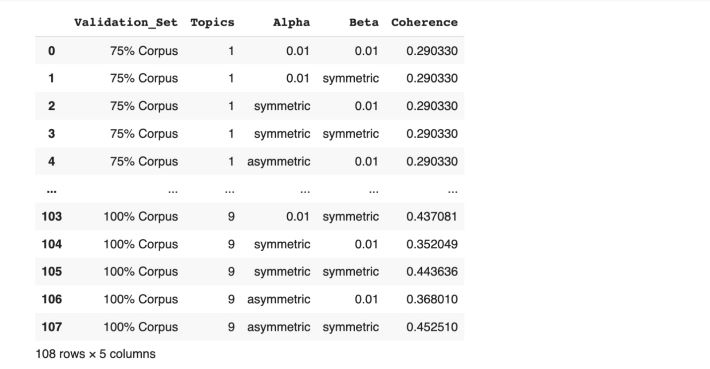

The table above shows the different Coherence scores we get by running the LDA with different Alpha values, Beta values, and Number of Topics. We grop by the Number of Topics, and take the .mean() of their coherence to generate the points for our plot. Based on where the "elbow" appeared when we plotted the results (see belwo), we chose our number of topics.

To ensure that these scores were *really* coherent, we decided to actually look at the outputs of the LDA. When we chose the hyperparameters that yielded the highest coherence (row 107), the model focused on maximizing specificity of word occurence within a document. This meant that when we fed each post through the model as an individual document, we ended up with extremely strange and unrepresentative topics. Words like "crystal," "redskin," "sandal," and "spanking" dominated the printout - but when we looked closer we saw that each of those words appeared in only 1 or 2 posts.

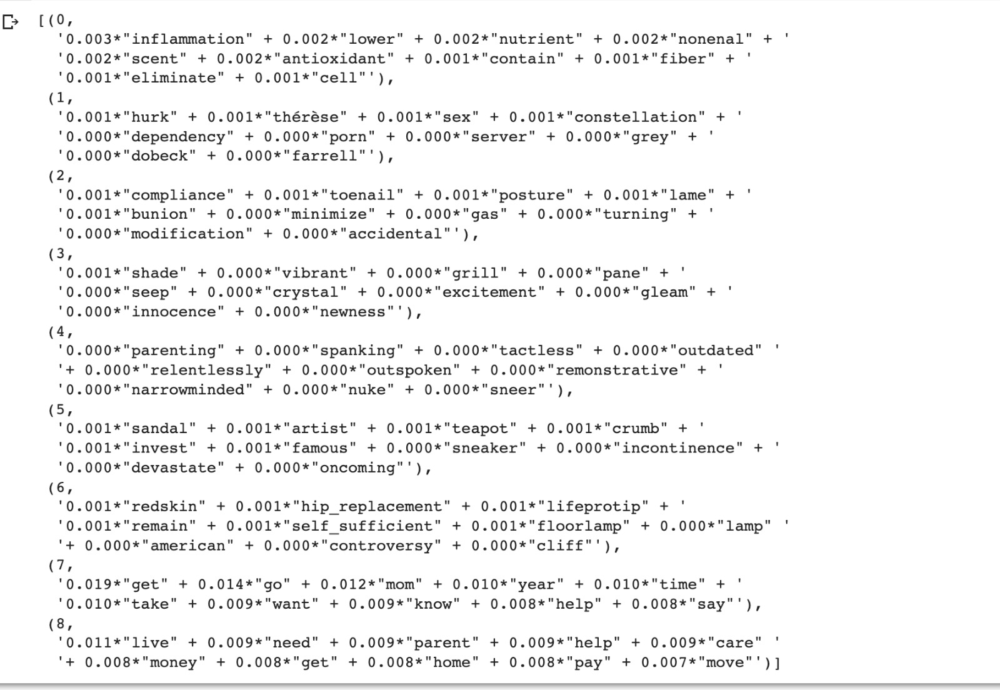

In [ ]:
result['Alpha'].unique
val = result.groupby('Topics')['Coherence'].mean()

Below we plot the coherence score according to number of topics so we can see where the "elbow" appears." Given plot above, we would have chosen 6 topics, as that is where we begin to see diminishing marginal returns. 

*This is a screenshot from one of our early attempts at using this method. Given the issues with the pushshift() servers in the last week of the semester, it's included here to show something similar to what we would have ended with, if we were able to continue tuning our hyperparameters. You can see with use this approach to completion in the final section of the project, where we focus on the comment dataset*

In [ ]:
import matplotlib.pyplot as plt
plt.plot(val)

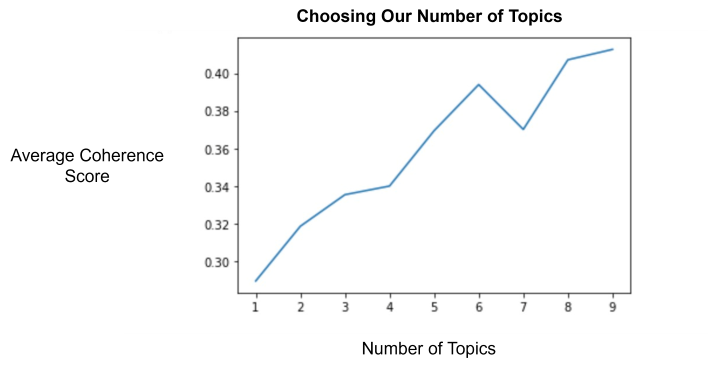

After many, many runs of with a variety of hyperparameters we found that, in isolation, coherence completely doesn't capture how well the model meets our needs. In the table above, the parameters described in line 105 (`topic = 9`, `Alpha = symmetric`, `Beta = symetric`, `Coherence = .44`) actually made the most sense when we actually interpreted them. Rerun the model with alpha =5, beta = 0.01, topic=10.

In [ ]:
num_topics = 9
np.random.seed = 151
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=num_topics, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha=5,
                                           eta=0.01) #Beta

Print the result

In [ ]:
from pprint import pprint

# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.066*"year" + 0.037*"mother" + 0.036*"time" + 0.018*"mom" + 0.017*"live" + '
  '0.017*"sister" + 0.016*"feel" + 0.016*"ago" + 0.014*"brother" + '
  '0.014*"family"'),
 (1,
  '0.034*"know" + 0.028*"thing" + 0.023*"make" + 0.019*"want" + 0.017*"dad" + '
  '0.016*"look" + 0.015*"see" + 0.014*"talk" + 0.012*"little" + 0.012*"time"'),
 (2,
  '0.032*"doctor" + 0.032*"help" + 0.025*"take" + 0.022*"care" + 0.022*"fall" '
  '+ 0.022*"week" + 0.020*"refuse" + 0.017*"health" + 0.017*"get" + '
  '0.015*"issue"'),
 (3,
  '0.074*"mom" + 0.033*"move" + 0.032*"house" + 0.026*"want" + 0.022*"take" + '
  '0.022*"live" + 0.021*"drive" + 0.014*"stuff" + 0.014*"go" + '
  '0.013*"husband"'),
 (4,
  '0.061*"parent" + 0.038*"life" + 0.029*"old" + 0.028*"feel" + 0.027*"age" + '
  '0.025*"live" + 0.017*"child" + 0.017*"want" + 0.016*"work" + '
  '0.015*"family"'),
 (5,
  '0.048*"home" + 0.041*"call" + 0.025*"visit" + 0.023*"care" + 0.022*"say" + '
  '0.020*"place" + 0.020*"go" + 0.020*"hour" + 0.018*"h

## 3.3 Interpeting the Results: What are the Most Common Topics

We believe the interactive visual below is a more effective topic discovery tool than the printed topics above. Firstly, the PCA projection on the left hand side of the visualization gives the viewer an intuitive 2D representation of how similar each topic group is. Secondly, the bar charts on the right-hand side let the user see plainly which words show up in a topic because they are generally common and which words truly typify the group. 

We take cluster 8 in the visualization as our example (which corresponds to cluster 6 in the printout above). Cluster 8 has the word "Need" appear more than any other word, but that word *also* shows up in about 2,700 of the 3,985 posts. Compared to the words “money,” “check,” and “pay," which show up almost nowhere outside of Cluster 8, the word "need" may be common but it is not very insightful. This latter group of words are more ‘surprising,’ in that they rarely occur outside of this cluster. 

The printed list of topics and percentages above does show the reader the most common words, but it does so without revealing the broader context. For this reason we point our audience towards the interpretive analysis we’ve done using the visualization: 


In [ ]:
%matplotlib inline
!pip install pyLDAvis

import pyLDAvis
import pyLDAvis.gensim_models

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(topic_model=lda_model, corpus=corpus, dictionary=id2word)
pyLDAvis.display(vis)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


Based on the visualization above, we have isolated 8 distinct problem areas, that each fit into 1 of the LDA-Defined Topics: 

**Topic 1: The Broader Network of Caretakers**
* Surprising Words: Sister, Friend, job, always, alone, brother, talk
* Interpretation:  This cluster seems to be focused on the larger network of care that tends to surround the elderly, and people looking to lean on that larger network for help 

**Topic 2: Sleepy Dads**
* Surprising Words:  Dad, Back, night, sit, bed, change, sleep, eat, med
* Interpretation: This topic contains a large percentage of the references to ‘dad’ and, interestingly, does not contain many references to “mom” or ”mother” – which we know from the wordcloud are among the most common words. So it seems to be about people looking for help with their fathers. It has words focused on household chores and sleep.

**Topic 3: Downsizing**
* Surprising Words: drive, stuff, keep, car, clean, room, husband, food
* Interpretation: The words “Drive,“stuff,” and “clean” almost exclusively appear in posts that are in this Topic-Group. When seen in the context of the other more common words like “keep,” “room,” and “husband” it is easy to imagine posts in this group being focused on managing parents possessions as they downsize to assisted living or pass away.

**Topic 4: Medical Needs**
* Surprising Words: doctor, hospital, health, fall, refuse, issue, due, ** grandma, pain, surgery, stroke, cancer, medical
* Interpretation: This topic group is clearly about medical needs and all of the challenges situations that come with it, such as refusal to see the doctor, pain after medical operations, and dealing with disease.  

**Topic 5: It’s Not All Bad**
* Surprising Words: Dad, little, love, great, post, man, wife, mind, watch, kind
* Interpretation: Of all the topics plotted in the PCA Projection, this one is most isolated. This makes sense after looking at the surprising words, which seem to be much more positive than negative (unlike all the other topics). Words like “love,” “kind,” and “great” typify this group – they are rarely found outside of it. 

**Topic 6: Round-the-Clock Medical Care**
* Surprising Words: Phone, Visit, Place, Facility, assisted_live, memory, send, provide, answer, nurse, service
* Interpretation: We know from our background research on the topic that many people turn to assisted living facilities when they are unable to provide the amount of care their aging parents need. Fortunately, our bi-gram work earlier in the project allowed for words like "assisted_live" to come through as a pair: the 2-word phrase comes up in over 500 of the posts in this topic group. *Interestingly*, this topic-group is also very isolated from the rest in the PCA projection – perhaps people turning to this as the solution are no longer focused on the smaller issues above, given that nursing facilities claim to resolve them all. 

**Topic 7: The Child Becomes the Parent**
* Surprising Words: Parent, age, child, support, situation, young, sibling
* Interpretation: This topic was among the most difficult to interpret – we can’t discern much unique insight from it because so many of the words that typify it are also common in many other posts. It does, however, capture nearly all the posts that contain the word ‘parent’. We believe posts in this topic-group may be about aging in general, or it may just be a catch-all.

**Topic 8: Break the Bank**
* Surprising Words: money, pay, check, state, option, bill, sign, insurance, cost, rent
* Interpretation: This topic was among the easiest to interpret: many of the words that appear here are not common in other topic-groups. It is about the enormous variety of financial needs and complexities that accompany caring for an aging parent. 

**Topic 9: The lost topic**
* Interpretation: After seeing that this topic is almost entirely engulfed by topic 1 and looking how “unsurprising” the words within it were, we decided a deep analysis would not yield much insight. If we were able to run this analysis again but with the optimal number of topics-groups we identified in an earlier step, I suspect this topic would not appear.


## 3.4 Deeper Analysis: Which of the Topics is Most Important

Next, we want to see which of the 8 key topics above is **most** important. We set out to do this in 2 ways. (1) we calculate how many posts have that topic-group as the one they most align with. (2) we examine how the concentration of those topics changes over time, with COVID-19 as the key marker to delineate time periods.

To start on (1), you can see below that we take each of the 3985 posts and asses how strongly they fit into each one of the 8 topics. Unlike K-Means clustering, LDA distributes each of the groups to each observation. For example, the post in at `document_topic[1]` fits most strongly into Topic 4 (with a weight of .087).

In [ ]:
topics = [lda_model[corpus[i]] for i in range(len(allbodylist))]

In [ ]:
def topics_document_to_dataframe(topics_document, num_topics):
    res = pd.DataFrame(columns=range(num_topics))
    for topic_weight in topics_document:
        res.loc[0, topic_weight[0]] = topic_weight[1]
    return res

In [ ]:
document_topic = \
pd.concat([topics_document_to_dataframe(topics_document, num_topics=num_topics) for topics_document in topics]) \
  .reset_index(drop=True).fillna(0)

In [ ]:
document_topic

,0,1,2,3,4,5,6,7,8
0,0.228535,0.040675,0.110761,0.046903,0.072499,0.102100,0.072506,0.027182,0.298840
1,0.090432,0.086909,0.064453,0.068289,0.087436,0.148477,0.268939,0.068090,0.116974
2,0.097718,0.100497,0.099243,0.101612,0.102243,0.126436,0.131538,0.098958,0.141756
3,0.096281,0.098723,0.116032,0.116550,0.118293,0.098641,0.126667,0.132000,0.096814
4,0.131830,0.096863,0.146172,0.124995,0.146383,0.091081,0.078592,0.103214,0.080870
...,...,...,...,...,...,...,...,...,...
3981,0.130944,0.083388,0.102645,0.152420,0.120855,0.137821,0.082176,0.092327,0.097424
3982,0.102041,0.102041,0.107319,0.102041,0.102041,0.120210,0.142857,0.119409,0.102041
3983,0.108696,0.108696,0.108696,0.108696,0.108696,0.130435,0.108696,0.108696,0.108696
3984,0.128331,0.114638,0.067883,0.121539,0.165120,0.096024,0.139209,0.081224,0.086033


<ipython-input-111-fe2700291d03>:10: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior.  In a future version these will be considered non-comparable.Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  if t < pd.Timestamp('2020-02-16'):
<ipython-input-111-fe2700291d03>:12: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior.  In a future version these will be considered non-comparable.Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  elif t < pd.Timestamp('2022-02-02'):
<ipython-input-111-fe2700291d03>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  topic_date_df['date_group'] = top

[Text(0.5, 1.0, 'Classify all posts to topics')]

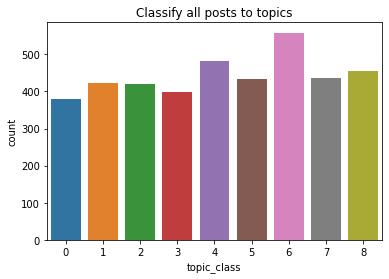

In [ ]:
# visualization

# get alltopics while keeping only id and date
# splitting data into 3 groups:
#  (1) Pre Covid = before 2/15/2020 
#  (2) Covid = 2/16/2020 - 2/1/2022 
#  (3)'Post' COVID = 2/2/2022 - Today

def group_covid(t):
  if t < pd.Timestamp('2020-02-16'):
    return 'pre-covid'
  elif t < pd.Timestamp('2022-02-02'):
    return 'during-covid'
  else:
    return 'post-covid' 
topic_date_df = alltopic[['id', 'created_date']]
topic_date_df['date_group'] = topic_date_df['created_date'].apply(group_covid)

# choose the column i.e topic with maximum probability
document_class_df = document_topic.idxmax(axis=1).reset_index(name='topic_class')
document_class_df = document_class_df[['topic_class']]

body_class_df = pd.merge(topic_date_df, document_class_df, left_index=True, right_index=True)

# seaborn countplot
import seaborn as sns
sns.countplot(x=body_class_df['topic_class']).set(title='Classify all posts to topics')

Above, you can see that one topic rises above the others. Unfortunatley, the `pushshift()` API servers broke down before we could clean up this visual. Can you guess which topic it is? 

If we were able to edit it, we would make it look more like this, revealing that the topic-group focused on money and finances was most frequently the highest-weighted topic for a post: 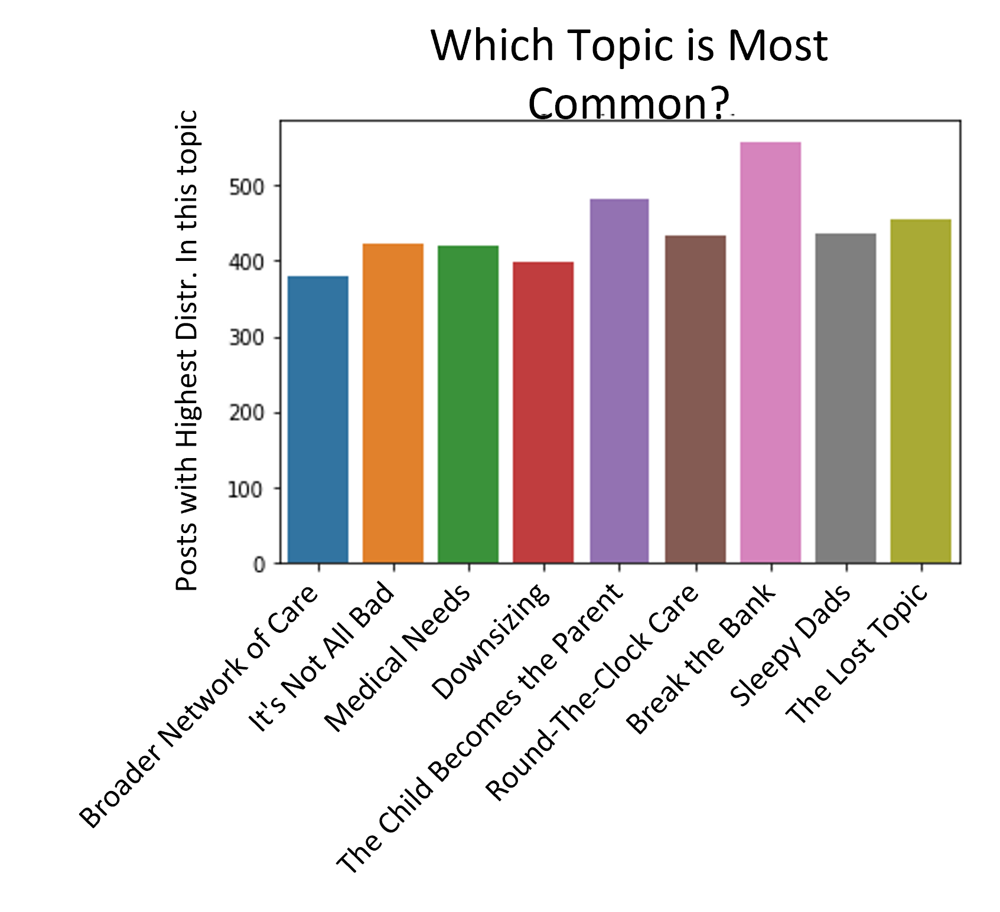

# **Part IV: LDA for Comments**
We took one step further to run the LDA for comments and hope that we can find more insights or even solutions were given by readers to help those who have problems

In [ ]:
lda_comments = allcomments
lda_comments['body'] = lda_comments[['body','link_id']].groupby('link_id')['body'].transform(lambda x: ','.join(x))
lda_comments = lda_comments.drop_duplicates(subset=['body','link_id'])

In [ ]:
#Tokenize comments 
allcommentlist = [tokenize_content(row) for row in lda_comments['body']]

#Flatten comments
flat_allcommentlist = [item for sublist in allcommentlist for item in sublist] 

#peep the output for verification
print(flat_allcommentlist)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
# Build the bigram and trigram models
import gensim
from gensim.utils import simple_preprocess
bigram = gensim.models.Phrases(allcommentlist, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[allcommentlist], threshold=100)  
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

/usr/local/lib/python3.8/dist-packages/gensim/models/phrases.py:598: UserWarning: For a faster implementation, use the gensim.models.phrases.Phraser class
  warnings.warn("For a faster implementation, use the gensim.models.phrases.Phraser class")


In [ ]:
import spacy
#Form Bigrams
data_words_bigrams = make_bigrams(allcommentlist)

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
nlp = spacy.load("en_core_web_sm", disable=['parser', 'ner'])

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:1][0][:30])

/usr/local/lib/python3.8/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


['start', 'mom', 'challenge', 'gift', 'allergic', 'scent', 'candle', 'lotion', 'game', 'book', 'search', 'severe', 'arthritis', 'hand', 'already', 'ton', 'photo', 'type', 'gift', 'live', 'assisted_live', 'cook', 'daughter', 'recommend', 'buy', 'book', 'record', 'reading', 'grandchild', 'love']


In [ ]:
import gensim.corpora as corpora

# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1][0][:30])

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 2), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 2), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 3), (19, 1), (20, 1), (21, 1), (22, 3), (23, 2), (24, 1), (25, 1), (26, 1), (27, 1), (28, 2), (29, 1)]


In [ ]:
num_topics = 9
np.random.seed = 151
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=num_topics, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha=5,
                                           eta=0.01) #Beta

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1023: RuntimeWarning: divide by zero encountered in log
  diff = np.log(self.expElogbeta)


BASE MODEL

In [ ]:
num_topics = 9
np.random.seed = 151
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=num_topics, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10) #Beta

In [ ]:
from pprint import pprint

# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.019*"life" + 0.018*"parent" + 0.017*"help" + 0.015*"make" + 0.014*"want" '
  '+ 0.011*"live" + 0.011*"care" + 0.011*"take" + 0.011*"feel" + 0.010*"need"'),
 (1,
  '0.012*"know" + 0.012*"time" + 0.012*"thing" + 0.012*"go" + 0.011*"good" + '
  '0.011*"take" + 0.010*"doctor" + 0.010*"mom" + 0.009*"thank" + 0.009*"see"'),
 (2,
  '0.029*"care" + 0.020*"home" + 0.019*"help" + 0.018*"need" + 0.011*"service" '
  '+ 0.010*"good" + 0.009*"also" + 0.009*"pay" + 0.009*"place" + '
  '0.009*"facility"'),
 (3,
  '0.015*"make" + 0.014*"need" + 0.012*"account" + 0.010*"money" + '
  '0.010*"sign" + 0.008*"bill" + 0.008*"pay" + 0.007*"lawyer" + 0.007*"take" + '
  '0.007*"power_attorney"'),
 (4,
  '0.021*"eat" + 0.019*"food" + 0.011*"make" + 0.010*"good" + 0.009*"try" + '
  '0.008*"water" + 0.008*"also" + 0.008*"maybe" + 0.007*"drink" + 0.006*"day"'),
 (5,
  '0.021*"move" + 0.018*"year" + 0.017*"mom" + 0.016*"house" + 0.015*"live" + '
  '0.014*"parent" + 0.013*"stuff" + 0.013*"money" + 0.012*"wa

In [ ]:
from gensim.models import CoherenceModel

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=texts, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Coherence Score:  0.3358496893460414


In [ ]:
import numpy as np
import tqdm

grid = {}
grid['Validation_Set'] = {}

# Topics range
min_topics = 5
max_topics = 13
step_size = 1
topics_range = range(min_topics, max_topics, step_size)

# Alpha parameter
alpha = list(np.arange(1, 5, 1))
alpha.append('symmetric')
alpha.append('asymmetric')

# Beta parameter
beta = list(np.arange(0.01, 0.05, 0.01))
beta.append('symmetric')

# Validation sets
num_of_docs = len(corpus)
corpus_sets = [gensim.utils.ClippedCorpus(corpus, int(num_of_docs*0.75)), 
               corpus]

corpus_title = ['75% Corpus', '100% Corpus']

model_results = {'Validation_Set': [],
                 'Topics': [],
                 'Alpha': [],
                 'Beta': [],
                 'Coherence': []
                }

# Can take a long time to run
if 1 == 1:
    pbar = tqdm.tqdm(total=(len(beta)*len(alpha)*len(topics_range)*len(corpus_title)))
    
    # iterate through validation corpuses
    for i in range(len(corpus_sets)):
        # iterate through number of topics
        for k in topics_range:
            # iterate through alpha values
            for a in alpha:
                # iterare through beta values
                for b in beta:
                    # get the coherence score for the given parameters
                    cv = compute_coherence_values(corpus=corpus_sets[i], dictionary=id2word, 
                                                  k=k, a=a, b=b)
                    # Save the model results
                    model_results['Validation_Set'].append(corpus_title[i])
                    model_results['Topics'].append(k)
                    model_results['Alpha'].append(a)
                    model_results['Beta'].append(b)
                    model_results['Coherence'].append(cv)
                    
                    pbar.update(1)
    pd.DataFrame(model_results).to_csv('result.csv', index=False)
    pbar.close()

100%|██████████| 96/96 [3:14:10<00:00, 121.36s/it]


In [ ]:
result = pd.read_csv('result.csv')

In [ ]:
result.sort_values('Coherence', ascending = False)

,Validation_Set,Topics,Alpha,Beta,Coherence
45,75% Corpus,12,symmetric,symmetric,0.394414
47,75% Corpus,12,asymmetric,symmetric,0.383071
41,75% Corpus,11,asymmetric,symmetric,0.381881
43,75% Corpus,12,0.1,symmetric,0.375703
95,100% Corpus,12,asymmetric,symmetric,0.374192
...,...,...,...,...,...
53,100% Corpus,5,asymmetric,symmetric,0.283828
51,100% Corpus,5,symmetric,symmetric,0.279803
52,100% Corpus,5,asymmetric,0.01,0.278235
58,100% Corpus,6,asymmetric,0.01,0.277929


In [ ]:
val = result.groupby('Topics')['Coherence'].mean()

In [ ]:
val1 = result[result['Topics'] == 8]

In [ ]:
val1.sort_values('Coherence', ascending = False)

,Validation_Set,Topics,Alpha,Beta,Coherence
23,75% Corpus,8,asymmetric,symmetric,0.372254
21,75% Corpus,8,symmetric,symmetric,0.359535
19,75% Corpus,8,0.1,symmetric,0.355953
22,75% Corpus,8,asymmetric,0.01,0.348160
71,100% Corpus,8,asymmetric,symmetric,0.344050
67,100% Corpus,8,0.1,symmetric,0.343856
20,75% Corpus,8,symmetric,0.01,0.342775
18,75% Corpus,8,0.1,0.01,0.342009
70,100% Corpus,8,asymmetric,0.01,0.335009
69,100% Corpus,8,symmetric,symmetric,0.333978


In [ ]:
import matplotlib.pyplot as plt
plt.plot(val)

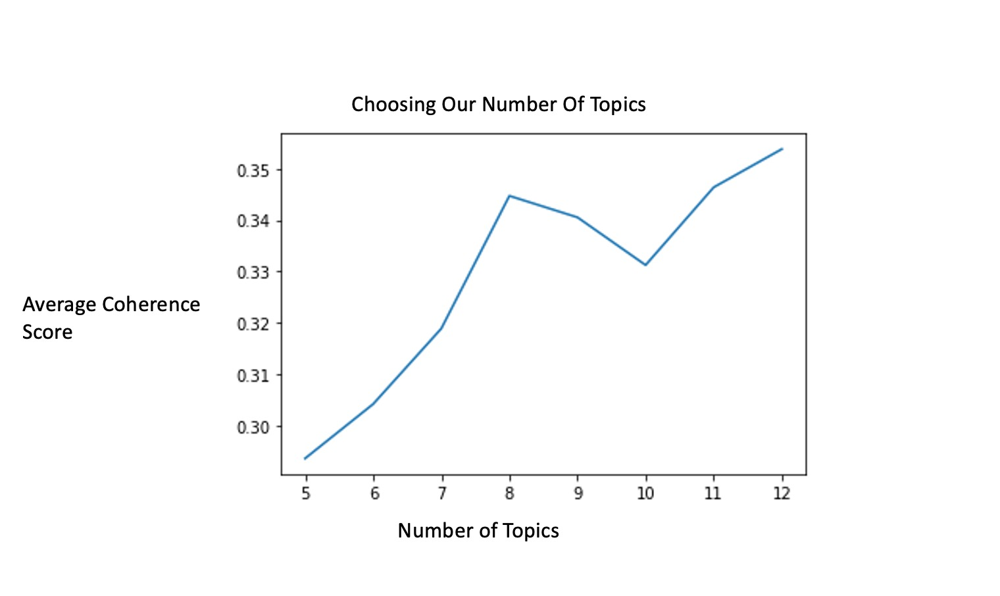

Retrain with *8* topics, alpha = 'asymmetric', eta = 'symmetric'




In [ ]:
num_topics = 8
np.random.seed = 150
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=num_topics, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha='asymmetric',
                                           eta='symmetric') #Beta

In [ ]:
from pprint import pprint

# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.014*"thing" + 0.013*"thank" + 0.012*"love" + 0.011*"good" + 0.010*"think" '
  '+ 0.010*"find" + 0.010*"old" + 0.010*"maybe" + 0.009*"people" + '
  '0.008*"time"'),
 (1,
  '0.012*"know" + 0.012*"take" + 0.011*"go" + 0.011*"time" + 0.011*"thing" + '
  '0.010*"good" + 0.010*"doctor" + 0.010*"help" + 0.010*"mom" + 0.010*"see"'),
 (2,
  '0.026*"care" + 0.022*"home" + 0.018*"help" + 0.018*"need" + 0.011*"place" + '
  '0.011*"service" + 0.010*"good" + 0.009*"facility" + 0.009*"also" + '
  '0.008*"pay"'),
 (3,
  '0.019*"money" + 0.014*"pay" + 0.013*"make" + 0.012*"need" + 0.011*"account" '
  '+ 0.008*"sign" + 0.008*"lawyer" + 0.008*"car" + 0.008*"bill" + '
  '0.007*"trust"'),
 (4,
  '0.018*"eat" + 0.017*"food" + 0.010*"stuff" + 0.009*"make" + 0.008*"good" + '
  '0.008*"water" + 0.007*"day" + 0.007*"try" + 0.007*"get" + 0.006*"also"'),
 (5,
  '0.016*"parent" + 0.015*"mom" + 0.015*"help" + 0.014*"want" + 0.013*"take" + '
  '0.013*"life" + 0.013*"live" + 0.012*"make" + 0.011*"need" + 0.

The tuning model for comments yields the result of Cohenrence score of 0.34

In [ ]:
from gensim.models import CoherenceModel

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=texts, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Coherence Score:  0.3444837541282343


In [ ]:
topics = [lda_model[corpus[i]] for i in range(len(allcommentlist))]

In [ ]:
def topics_document_to_dataframe(topics_document, num_topics):
    res = pd.DataFrame(columns=range(num_topics))
    for topic_weight in topics_document:
        res.loc[0, topic_weight[0]] = topic_weight[1]
    return res

In [ ]:
document_topic = \
pd.concat([topics_document_to_dataframe(topics_document, num_topics=num_topics) for topics_document in topics]) \
  .reset_index(drop=True).fillna(0)

The distribution of comments per post throughout 8 topics


In [ ]:
document_topic

,0,1,2,3,4,5,6,7
0,0.639298,0.046527,0.056973,0.000000,0.052922,0.083412,0.000000,0.1165
1,0.000000,0.922766,0.000000,0.000000,0.000000,0.061587,0.000000,0.0000
2,0.172298,0.569973,0.000000,0.000000,0.055718,0.159890,0.039786,0.0000
3,0.216991,0.000000,0.000000,0.096006,0.000000,0.095924,0.587584,0.0000
4,0.000000,0.000000,0.438335,0.054221,0.078429,0.422386,0.000000,0.0000
...,...,...,...,...,...,...,...,...
4094,0.099152,0.000000,0.892411,0.000000,0.000000,0.000000,0.000000,0.0000
4095,0.027385,0.019777,0.780614,0.135561,0.010976,0.000000,0.000000,0.0000
4096,0.014609,0.010404,0.948763,0.000000,0.000000,0.000000,0.000000,0.0000
4097,0.000000,0.000000,0.599052,0.219825,0.000000,0.000000,0.167322,0.0000


Interestingly, Comments are far more concentrated into a small number of topics than the posts that they are responding to. When looking at the LDA output, we can see that topic 1 is typified by words like "thank," "Love," and "good" - which suggests to us that a great deal of what caretakers get out of the r/agingparents subreddit is emotional support from people who can easily empathize with their situation.

# **CONCLUSION**

Throughout the project, we **scrawled** our data from Reddit, **preprocessed** and did **exploratory data analysis** to find the pattern including the distribution of the word. We also applied **wordclouds** to have a general idea of the top frequent words from titles, bodies and comments. We plotted the **linechart** for trend to see if the number of topics increase overtime. What we learned from the EDA was that Mom and Mother were much more frequent than any other words or concepts - including Dad and Father. We also found that help, think, time, hospital also appear with high frequency. To learn more about the topic, the next step was to apply the **Latent Dirichlet Allocation (LDA)** to find the topics. 

We ran **LDA on Titles, Body**. The vanilla model gave us a very general idea of what the topics are, however, to have more "accuracy" in this case called "Coherence", we **tune the model** by using **hyperparameters** "alpha" and "beta". After fine tuning, we **retrained** the model again and were able to have the higher coherence than our vanilla model. We interpretted the results of the topic's clusters. Intuitively, the results were surprisingly meet our expectation because they were about health, eating habit, homecare, finance, which are the problems that mostly aging people are commonly faced. 

To take one step further, we did **LDA on comments** to see if the comments can give us more insights or solution, but with the results, even after tuning, we couldn't find any more insight. 

To **visualize** the data, we use **interactive graph**, so we can drag and interact with the topics to have more insights of the word's distributions. 

